<ipython-input-10-7e29407bcec3>:118: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point1.set_data(x1, y1)
<ipython-input-10-7e29407bcec3>:119: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point2.set_data(x2, y2)


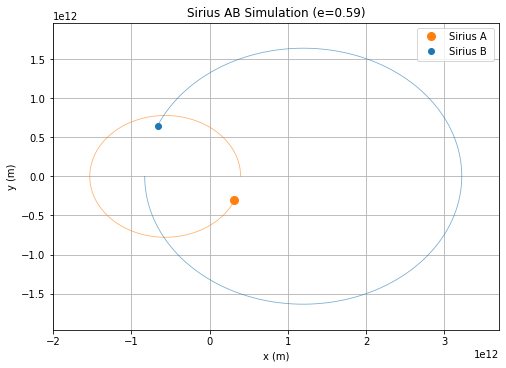

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# A. 상수 및 초기 조건 설정 (실제 SI 단위계)

# 1. 실제 물리 상수
G_real = 6.674e-11  # 만유인력 상수 (N m^2 / kg^2)
M_sun = 1.9891e30      # 태양 질량 (kg)
AU = 1.495978707e11    # 천문단위 (meters)
YEAR = 365 * 24 * 3600 # 1년 (seconds)

# 2. 시뮬레이션 시간 설정 (초 단위)
dt = 24 * 3600      # 시간 간격 
T_max = 50 * YEAR   # 총 시뮬레이션 시간 (대략 1주기는 50년)
num_steps = int(T_max / dt)

# 3. 시리우스 계 실제 파라미터
e = 0.59                # 이심률
a_real = 20.0 * AU      # 궤도 장반경 (meters)

# 4. 실제 질량 (kg)
m1_real = 2.06 * M_sun  # Sirius A
m2_real = 0.98 * M_sun  # Sirius B
M_total_real = m1_real + m2_real

# 5. 초기 위치 (m) - 근일점(Periapsis) 기준
r_peri_real = a_real * (1.0 - e) 
# 질량 중심(COM)을 (0,0)에 고정
r1_0 = np.array([  r_peri_real * (m2_real / M_total_real), 0.0])
r2_0 = np.array([ -r_peri_real * (m1_real / M_total_real), 0.0])

# 6. 초기 속도 (m/s) - 근일점(Periapsis) 기준
# 근일점에서의 상대 속도
v_peri_real = np.sqrt( (G_real * M_total_real * (1.0 + e)) / (a_real * (1.0 - e)) )

v1_0 = np.array([0.0,  v_peri_real * (m2_real / M_total_real)])
v2_0 = np.array([0.0, -v_peri_real * (m1_real / M_total_real)])

# 결과를 저장할 배열 초기화
r1_history = np.zeros((num_steps, 2))
r2_history = np.zeros((num_steps, 2))

# 현재 위치 및 속도 변수 초기화
r1, v1 = r1_0.copy(), v1_0.copy()
r2, v2 = r2_0.copy(), v2_0.copy()


# B. 수치 적분 시뮬레이션 루프

for i in range(num_steps):
    r1_history[i] = r1
    r2_history[i] = r2
    
    r_vec = r1 - r2
    r_mag = np.linalg.norm(r_vec)
    if r_mag == 0:
        a1 = np.zeros(2)
        a2 = np.zeros(2)
    else:
        # G_real, m1_real, m2_real 사용
        force_factor = -G_real / r_mag**3
        a1 = force_factor * m2_real * r_vec
        a2 = force_factor * m1_real * (-r_vec)
    
    v1_new = v1 + a1 * dt
    v2_new = v2 + a2 * dt
    
    r1 = r1 + v1_new * dt
    r2 = r2 + v2_new * dt
    
    v1 = v1_new
    v2 = v2_new




# C. Matplotlib 애니메이션 시각화

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_aspect('equal')
ax.grid(True)
ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_title('Sirius AB Simulation (e=0.59)')

all_positions = np.vstack((r1_history, r2_history))
x_min_val, y_min_val = np.min(all_positions, axis=0)
x_max_val, y_max_val = np.max(all_positions, axis=0)
x_padding = (x_max_val - x_min_val) * 0.1
y_padding = (y_max_val - y_min_val) * 0.1
ax.set_xlim(x_min_val - x_padding, x_max_val + x_padding)
ax.set_ylim(y_min_val - y_padding, y_max_val + y_padding)


point1, = ax.plot([], [], 'o', color='tab:orange', markersize=8, label='Sirius A ')
point2, = ax.plot([], [], 'o', color='tab:blue', markersize=6, label='Sirius B ')
trail1, = ax.plot([], [], '-', color='tab:orange', linewidth=0.8, alpha=0.6)
trail2, = ax.plot([], [], '-', color='tab:blue', linewidth=0.8, alpha=0.6)

ax.legend()

# 프레임 다운샘플링 (애니메이션 용량 줄이기 위함)
frame_step = max(1, num_steps // 500) 
frames = range(0, num_steps, frame_step)

def init():
    point1.set_data([], [])
    point2.set_data([], [])
    trail1.set_data([], [])
    trail2.set_data([], [])
    return point1, point2, trail1, trail2

def update(frame_index):
    i = frame_index
    x1, y1 = r1_history[i]
    x2, y2 = r2_history[i]
    point1.set_data(x1, y1)
    point2.set_data(x2, y2)
    trail1.set_data(r1_history[:i+1, 0], r1_history[:i+1, 1])
    trail2.set_data(r2_history[:i+1, 0], r2_history[:i+1, 1])
    return point1, point2, trail1, trail2

ani = animation.FuncAnimation(fig, lambda idx: update(idx), frames=list(frames), init_func=init, interval=20, blit=True)

try:
    from IPython.display import HTML, display
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print('HTML embed failed:', e)